In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2007


In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.43,2.72,3.16,3.22,2.79,2.06,1.90,1.45,1.64,2.11,2.65,2.38
1,1.0,2.38,2.63,2.99,3.04,2.69,2.11,1.92,1.50,1.66,2.06,2.51,2.25
2,1.5,2.33,2.55,2.84,2.88,2.61,2.15,1.94,1.55,1.68,2.01,2.39,2.15
3,2.0,2.29,2.48,2.71,2.75,2.54,2.19,1.97,1.61,1.71,1.99,2.30,2.08
4,2.5,2.26,2.42,2.60,2.64,2.48,2.22,2.01,1.67,1.74,1.98,2.25,2.05


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,2.50630,2.561100,2.594350,2.630450,2.567750,2.633500,2.593300,2.581250,2.614900,2.632350,2.660550,2.603650
std,28.939592,0.07785,0.067249,0.075996,0.075915,0.061033,0.118227,0.149054,0.233417,0.225366,0.167917,0.108267,0.131077
min,0.500000,2.22000,2.300000,2.360000,2.400000,2.340000,2.060000,1.900000,1.450000,1.640000,1.980000,2.210000,2.050000
25%,25.375000,2.50000,2.560000,2.590000,2.630000,2.560000,2.640000,2.607500,2.610000,2.650000,2.660000,2.680000,2.620000
50%,50.250000,2.53000,2.580000,2.605000,2.640000,2.585000,2.670000,2.640000,2.660000,2.690000,2.690000,2.700000,2.650000
75%,75.125000,2.55000,2.600000,2.620000,2.650000,2.600000,2.690000,2.670000,2.690000,2.720000,2.710000,2.710000,2.660000
max,100.000000,2.59000,2.720000,3.160000,3.220000,2.790000,2.700000,2.680000,2.700000,2.730000,2.720000,2.710000,2.670000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,1.371281,1.173492,0.692676,0.600214,1.081018,2.292613,2.834246,4.279510,4.143819,3.107726,1.915415,2.422274
Jan,1.371281,0.006061,0.004804,0.002832,0.002699,0.003932,0.008188,0.010118,0.015647,0.015473,0.012133,0.007920,0.009462
Feb,1.173492,0.004804,0.004522,0.003996,0.003893,0.004016,0.005459,0.006574,0.010048,0.010378,0.008700,0.006460,0.007085
Mar,0.692676,0.002832,0.003996,0.005775,0.005750,0.004036,0.000905,0.000716,0.000789,0.001897,0.003014,0.004007,0.003145
Apr,0.600214,0.002699,0.003893,0.005750,0.005763,0.003943,0.000583,0.000323,0.000168,0.001298,0.002596,0.003776,0.002834
May,1.081018,0.003932,0.004016,0.004036,0.003943,0.003725,0.004114,0.004873,0.007369,0.007825,0.006813,0.005395,0.005683
June,2.292613,0.008188,0.005459,0.000905,0.000583,0.004114,0.013978,0.017552,0.027450,0.026460,0.019471,0.011296,0.014707
July,2.834246,0.010118,0.006574,0.000716,0.000323,0.004873,0.017552,0.022217,0.034744,0.033420,0.024508,0.014154,0.018586
Aug,4.279510,0.015647,0.010048,0.000789,0.000168,0.007369,0.027450,0.034744,0.054483,0.052428,0.038366,0.022111,0.029072
Sept,4.143819,0.015473,0.010378,0.001897,0.001298,0.007825,0.026460,0.033420,0.052428,0.050790,0.037493,0.022160,0.028633


In [5]:
df.var()

Matuarity    837.500000
Jan            0.006061
Feb            0.004522
Mar            0.005775
Apr            0.005763
May            0.003725
June           0.013978
July           0.022217
Aug            0.054483
Sept           0.050790
Oct            0.028196
Nov            0.011722
Dec            0.017181
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.43,2.72,3.16,3.22,2.79,2.06,1.90,1.45,1.64,2.11,2.65,2.38
1,1.0,2.38,2.63,2.99,3.04,2.69,2.11,1.92,1.50,1.66,2.06,2.51,2.25
2,1.5,2.33,2.55,2.84,2.88,2.61,2.15,1.94,1.55,1.68,2.01,2.39,2.15
3,2.0,2.29,2.48,2.71,2.75,2.54,2.19,1.97,1.61,1.71,1.99,2.30,2.08
4,2.5,2.26,2.42,2.60,2.64,2.48,2.22,2.01,1.67,1.74,1.98,2.25,2.05


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

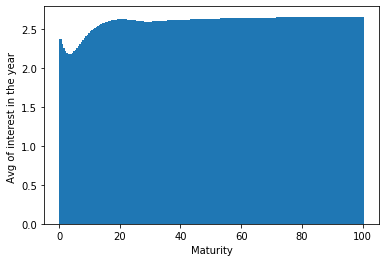

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 19 weeks

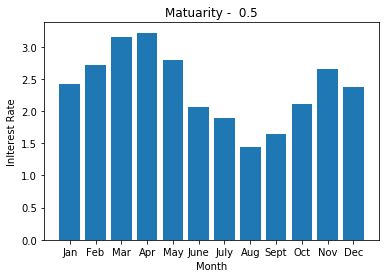

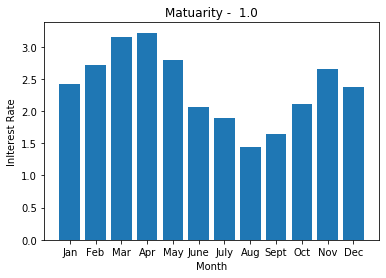

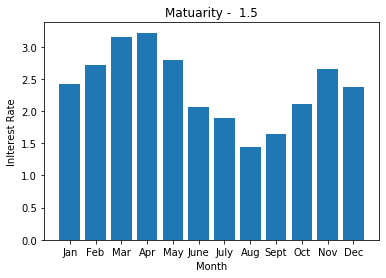

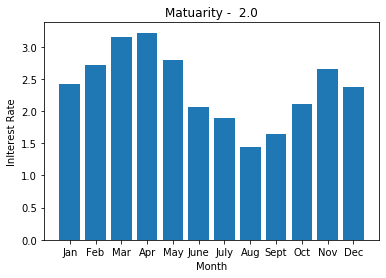

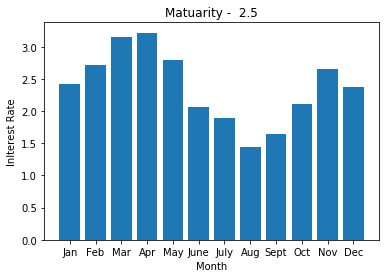

...

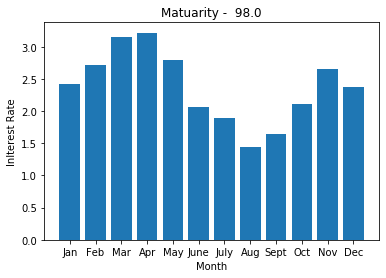

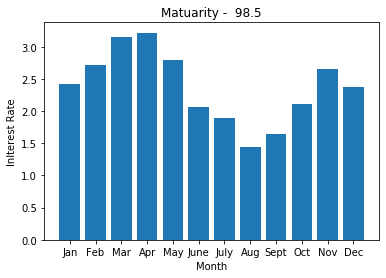

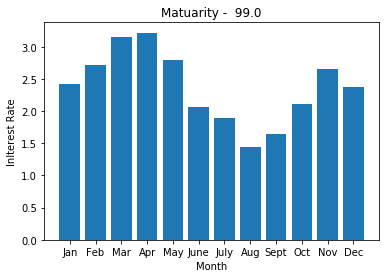

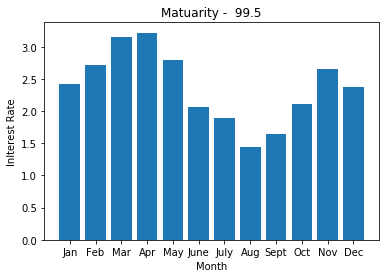

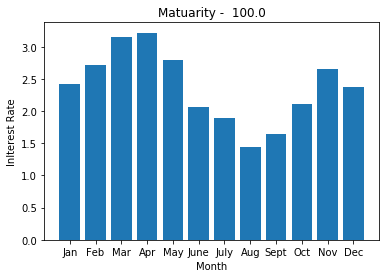

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

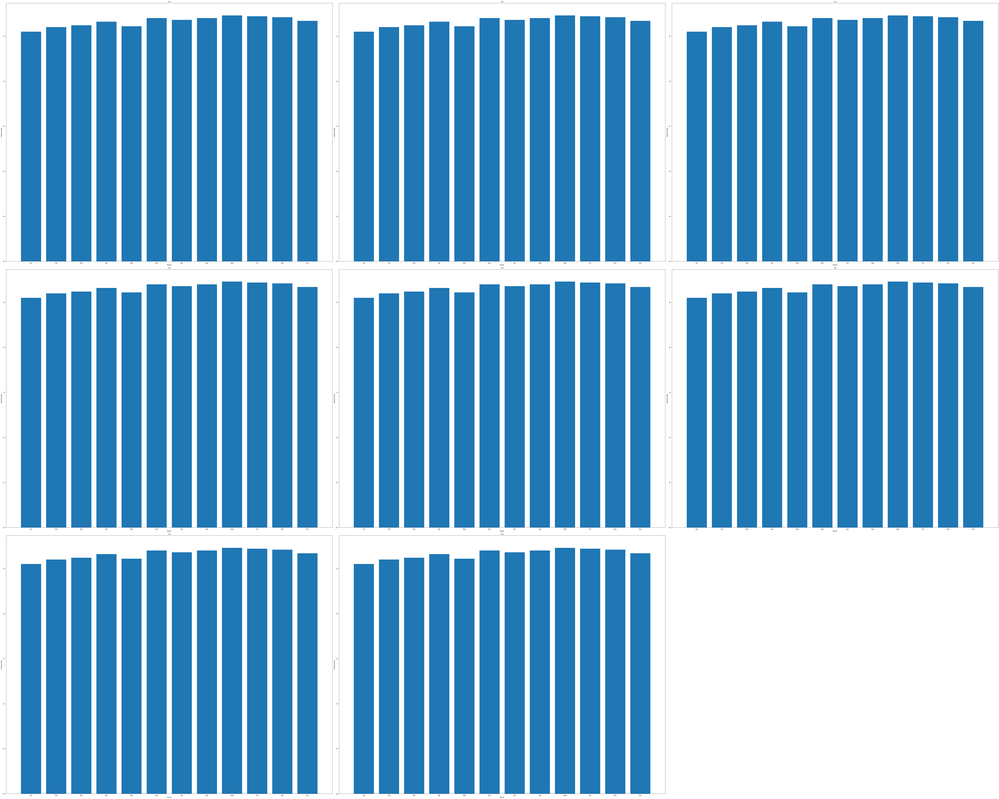

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

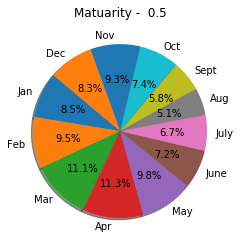

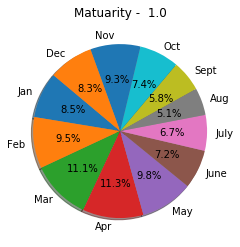

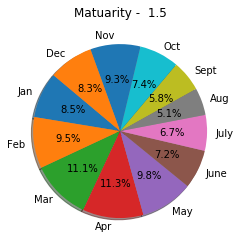

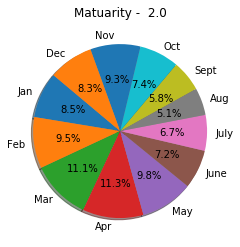

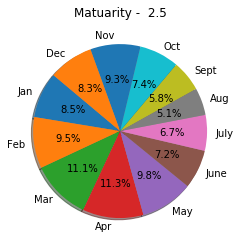

...

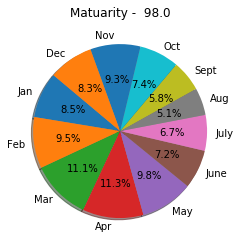

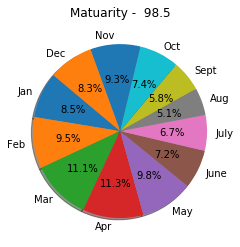

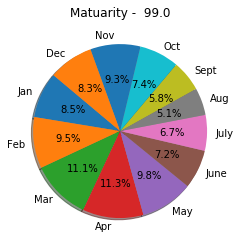

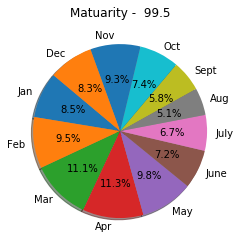

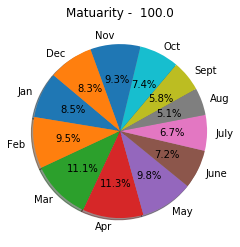

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

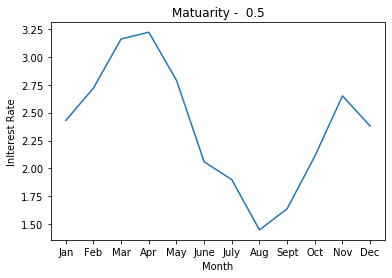

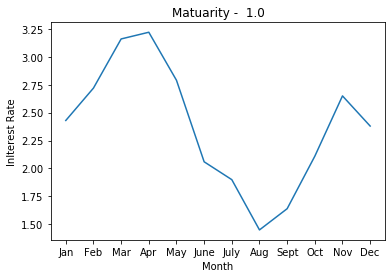

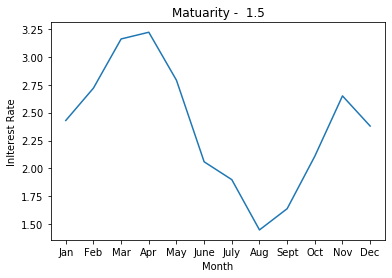

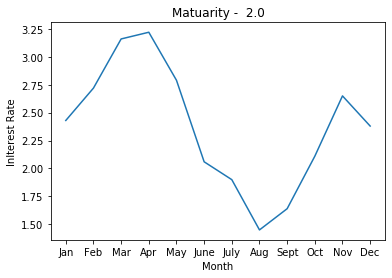

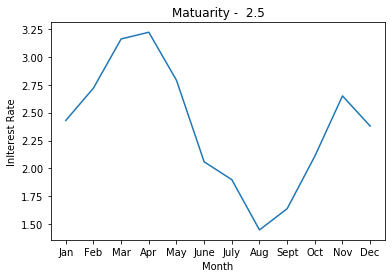

...

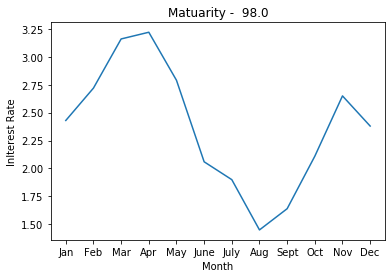

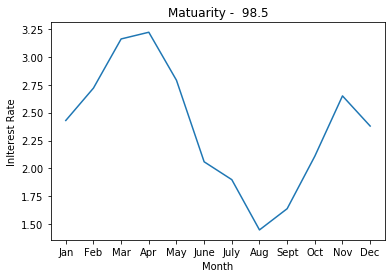

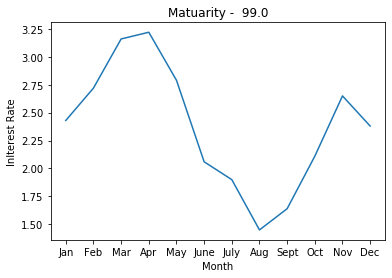

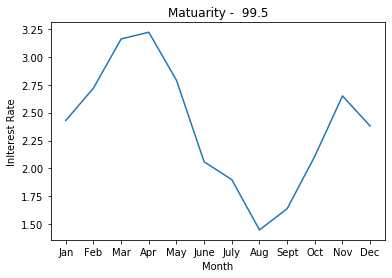

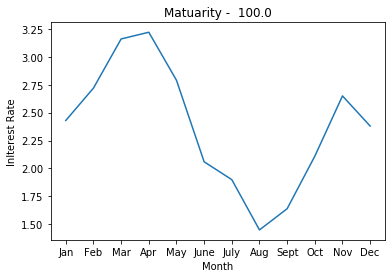

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

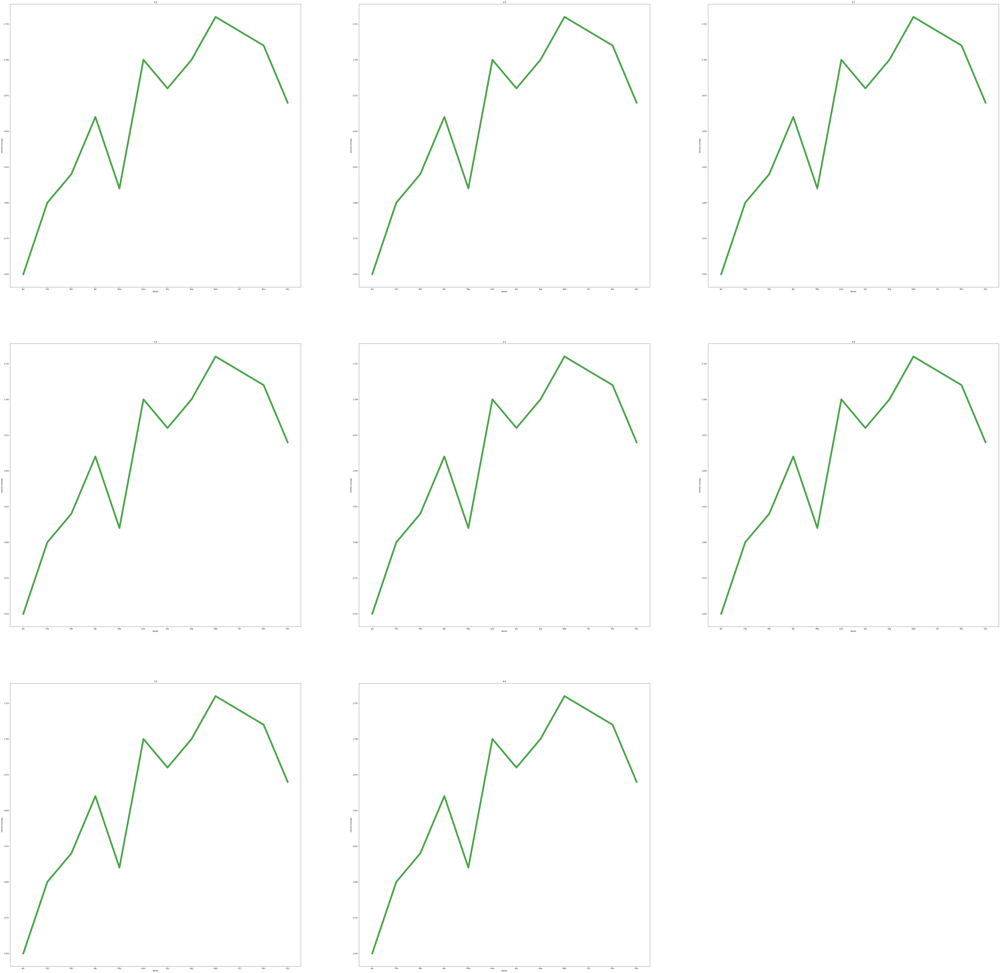

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [16]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.5982875